# UK 2012 Accidents Dataset - Classification
#### MSDS 7331 Data Mining - Section 403 - Lab 2
#### Group 3: Bhuvana Adur Kannan (Team Lead), Selwyn Samuel, Anjli Solsi 

<span style="color:blue">
    
### Summary 

The focus of the lab is to perform two specific tasks in prediction based on the dataset:

#### Task 1

* Build three different classification models to predict the accident severity and evaluate the performance of the models as per the predefined criteria. Predicting the accident severity is a classification problem with three classes, 'Slight', 'Serious' and 'Fatal'.

#### Task 2

* Build three different regression models to predict the engine capacity of the car involved in the accident and evaluate the performance of the models as per the predefined criteria. Predicting engine capacity may not be very useful in the real life analysis but we chose to do it because it was the only meaningful continuous variable in the dataset. We do not expect great performance of the models but we consider this as a valuable learning exercise.

<span style="color:blue">
    
### Business Understanding

The UK government has gathered traffic accident data from the years 2000 to 2016, capturing data for over 1.6 million accidents. The data is collected from police reports and does not include fender bender type incidents. In order to reduce the complexity and resource requirements, we will be working on the accidents occured during 2012.

This dataset is originally from the UK government website but is hosted by BigML Inc. It can be downloaded fro the link: https://bigml.com/user/czuriaga/gallery/dataset/525dcd15035d076e7f00e3ac. 


In [1]:
# Import the libraries needed for the lab
import pandas as pd
import numpy as np

# Vizualisation
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn import metrics as mt

import plotly.offline as py 
import plotly.graph_objs as go
from plotly import tools

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
py.init_notebook_mode(connected=True)

In [130]:
# Load the UK Accidents 2012 dataset

df = pd.read_csv('../../data/UKAccidents.csv')
print('UK Accidents dataset dimensions: ', df.shape)

UK Accidents dataset dimensions:  (265877, 55)


C:\Tools\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning:

Columns (28) have mixed types. Specify dtype option on import or set low_memory=False.



<span style="color:Green">
    
# Data Preparation 1

**Points: 10**

*Define and prepare your class variables. Use proper variable representations (int, float, one-hot, etc.). Use pre-processing methods (as needed) for dimensionality reduction, scaling, etc. Remove variables that are not needed/useful for the analysis.*

<span style="color:blue">
    
### Data Quality

#### Duplicate Data
Some of the records in the dataset appear to be duplicate, but that was not the case once they were observed closely. When two or more vehicles are involved in an accident, there is an instance for each vehicle with the location and other features being the same; however, the driver and vehicle information is different.

#### Missing Values

* The 1st Road Number and the 2nd Road Number attributes have a considerable number of missing values. Based on our understanding of the data we will drop these features as the road numbers may not have a direct impact on the accident severity.
* LSOA (Lower layer Super Output) of Accident Location has a few thousand missing values. Lower Layer Super Output Areas are a geographic hierarchy designed to improve the reporting of small area statistics in England and Wales. Since we have the accident latitude and longitude attributes, we can drop the entire feature.
* Engine Capacity, Age of Vehicle and Propulsion Code have a few thousand missing values. Instead of imputing the mean or median values for these continuous attributes, we will delete the instances with missing values as we have enough instances for our analysis and prediction.

#### Removing unrelated attributes

Based on our undestanding and manual analysis of the data, the following attributes will be removed as they are related to accident severity.

* Date.year: We have already limited our dataset to 2012 data.
* Date: We have separate attributes for month, day, hour, minute and second.
* Location Easting OSGR and Location Northing OSGR are geographic Cartesian coordinates for a point. They can be removed as we have latitudes and longitudes.
* We will remove Police Force, Local Authority (District) and Local Authority (Highway) as they are informational categorical attributes that may not have an impact on the accident severity.
* 1st Road Class and 2nd Road class have large number of 'Unclassified' data and we will drop those attributes as well.
* Pedestrian Crossing-Human Control has most of its value as 'None within 50 metres' which may not be very useful in prediction.
* Pedestrian Crossing-Physical Facilities has most of its value as 'No physical crossing facilities within 50 metres' which may not be very useful in prediction.
* Special Conditions at Site has most of its value as 'None' which may not be very useful in prediction.
* Carriageway Hazards at Site has most of its value as 'None' which may not be very useful in prediction.
* Did Police Officer Attend happens after the accident and will not have an impact on the accident severity.
* Towing and Articulation has most of the values as 'No tow/articulation', 'Other tow' or 'Data missing or out of range' which may not be very useful in prediction.
* Vehicle Location-Restricted Lane has most of its value as 'On main c'way - not in restricted lane' which may not be very useful in prediction.

We will need to perform one hot encoding for all the categorical variables.

In [131]:
# Remove unwanted attributes
df.drop(['1st Road Number', '2nd Road Number', 'Date', 'Date.year', 'Location Easting OSGR', 'Location Northing OSGR', 
         'Local Authority (District)', 'Local Authority (Highway)', '1st Road Class', '2nd Road Class', 
         'Pedestrian Crossing-Human Control', 'Pedestrian Crossing-Physical Facilities', 'Special Conditions at Site', 
         'Carriageway Hazards', 'Did Police Officer Attend', 'LSOA of Accident Location', 'Towing and Articulation', 
         'Vehicle Location-Restricted Lane', 'Police Force'], axis=1, inplace=True)

# Drop all the instances with NaN values
df.dropna(inplace=True)

In [132]:
y_classification = df['Accident Severity']
X_classification = df
X_classification.drop(['Accident Severity'], axis=1, inplace=True)

y_regression = df['Engine Capacity (CC)']
X_regression = df
X_regression.drop(['Engine Capacity (CC)'], axis=1, inplace=True)

<span style="color:blue">
    
### One hot encoding of Categorical attributes

In [133]:
# List all the categorical attributes identified for one hot encoding
categorical_attributes = ['Road Type', 'Junction Detail', 'Junction Control', 'Light Conditions', 'Weather Conditions', 
                          'Road Surface Conditions', 'Urban or Rural Area', 'Vehicle Type', 'Vehicle Manoeuvre', 
                          'Junction Location', 'Skidding and Overturning', 'Hit Object in Carriageway', 
                          'Vehicle Leaving Carriageway', 'Hit Object off Carriageway', '1st Point of Impact', 
                          'Was Vehicle Left Hand Drive?', 'Journey Purpose of Driver', 'Sex of Driver', 'Age Band of Driver', 
                          'Propulsion Code', 'Driver IMD Decile', 'Driver Home Area Type']

# Change the data type for the categorical attributes
for feature in list(df.columns):
    if feature in categorical_attributes:
        X_classification[feature] = X_classification[feature].astype('category')
        X_regression[feature] = X_regression[feature].astype('category')

# one hot encoding
X_classification = pd.get_dummies(X_classification, sparse=True)
X_regression = pd.get_dummies(X_regression, sparse=True)

print(X_classification.shape)
print(X_regression.shape)

(190330, 190)
(190330, 190)


<span style="color:blue">
    
### Standardization

In [134]:
# Let's standardize the continuous attributes and see
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
sc.fit(X_classification)
X_classification_std = sc.transform(X_classification)

sc.fit(X_regression)
X_regression_std = sc.transform(X_regression)

C:\Tools\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning:

Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.

C:\Tools\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: DataConversionWarning:

Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.

C:\Tools\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning:

Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.

C:\Tools\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning:

Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.



In [135]:
# Write the modified dataframe to a CSV file so that we can use it elsewhere
#temp = pd.get_dummies(df, sparse=True)
#temp.to_csv('../../data/UKAccidents_Cleaned.csv', index=False)

<span style="color:Green">
    
# Data Preparation 2

**Points: 5**

*Describe the final dataset that is used for classification/regression (include a description of any newly formed variables you created).*

<span style="color:blue">
    
### Data for Classification Task

The dataset for the classification task contains 190 attributes including the one hot encoded attributes. The response is Accident Severity which is stored in y_classification and has three classes, 'Slight', 'Serious' and 'Fatal'.

In [136]:
print(X_classification.shape)
print(X_classification.info())
print(y_classification.value_counts())
X_classification.head()

(190330, 190)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 190330 entries, 0 to 265876
Columns: 190 entries, Longitude to Driver Home Area Type_Urban area
dtypes: float64(9), int64(3), uint8(178)
memory usage: 22.9 MB
None
Slight     163657
Serious     24465
Fatal        2208
Name: Accident Severity, dtype: int64


,Longitude,Latitude,Number of Vehicles,Number of Casualties,Speed limit,Age of Vehicle,Date.month,Date.day-of-month,Date.day-of-week,Date.hour,...,Driver IMD Decile_Less deprived 40-50%,Driver IMD Decile_More deprived 10-20%,Driver IMD Decile_More deprived 20-30%,Driver IMD Decile_More deprived 30-40%,Driver IMD Decile_More deprived 40-50%,Driver IMD Decile_Most deprived 10%,Driver Home Area Type_Data missing or out of range,Driver Home Area Type_Rural,Driver Home Area Type_Small town,Driver Home Area Type_Urban area
0,-0.169101,51.493429,2,1,30,5.0,1.0,19.0,4.0,20.0,...,0,0,0,0,0,0,0,0,0,1
4,-0.188636,51.487618,2,1,30,8.0,1.0,10.0,2.0,10.0,...,0,0,1,0,0,0,0,0,0,1
5,-0.188636,51.487618,2,1,30,2.0,1.0,10.0,2.0,10.0,...,0,1,0,0,0,0,0,0,0,1
6,-0.200259,51.514325,1,1,30,2.0,1.0,18.0,3.0,12.0,...,0,0,0,1,0,0,0,0,0,1
7,-0.183773,51.497614,1,1,30,5.0,1.0,17.0,2.0,20.0,...,0,0,0,0,0,0,0,0,0,1


<span style="color:blue">
    
### Data for Regression Task

The dataset for the regression task also contains 190 attributes including the one hot encoded attributes. The response is Engine Capacity which is stored in y_regression.

#### Outliers

In the engine capacity data, we found there was an outlier that had a value of 91000. We considered that as an anamoly and removed the data point for our models.

In [137]:
import plotly.offline as py 
import plotly.graph_objs as go

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
py.init_notebook_mode(connected=True)

b1 = go.Box(
    y=y_regression,
    name="Engine Capacity - Regression Task"
)

data = [b1]
py.iplot(data)

In [145]:
index = y_regression[y_regression >= 91000].index[0]
print(index)
y_regression = y_regression.drop(index=index)

63891


In [149]:
X_regression_std = np.delete(X_regression_std, [index], axis=0)
print(X_regression_std.shape)

(190329, 190)


In [150]:
b1 = go.Box(
    y=y_regression,
    name="Engine Capacity - Regression Task"
)

data = [b1]
py.iplot(data)

In [151]:
print(X_regression.shape)
print(X_regression.info())
X_regression.head()

(190330, 190)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 190330 entries, 0 to 265876
Columns: 190 entries, Longitude to Driver Home Area Type_Urban area
dtypes: float64(9), int64(3), uint8(178)
memory usage: 27.9 MB
None


,Longitude,Latitude,Number of Vehicles,Number of Casualties,Speed limit,Age of Vehicle,Date.month,Date.day-of-month,Date.day-of-week,Date.hour,...,Driver IMD Decile_Less deprived 40-50%,Driver IMD Decile_More deprived 10-20%,Driver IMD Decile_More deprived 20-30%,Driver IMD Decile_More deprived 30-40%,Driver IMD Decile_More deprived 40-50%,Driver IMD Decile_Most deprived 10%,Driver Home Area Type_Data missing or out of range,Driver Home Area Type_Rural,Driver Home Area Type_Small town,Driver Home Area Type_Urban area
0,-0.169101,51.493429,2,1,30,5.0,1.0,19.0,4.0,20.0,...,0,0,0,0,0,0,0,0,0,1
4,-0.188636,51.487618,2,1,30,8.0,1.0,10.0,2.0,10.0,...,0,0,1,0,0,0,0,0,0,1
5,-0.188636,51.487618,2,1,30,2.0,1.0,10.0,2.0,10.0,...,0,1,0,0,0,0,0,0,0,1
6,-0.200259,51.514325,1,1,30,2.0,1.0,18.0,3.0,12.0,...,0,0,0,1,0,0,0,0,0,1
7,-0.183773,51.497614,1,1,30,5.0,1.0,17.0,2.0,20.0,...,0,0,0,0,0,0,0,0,0,1


<span style="color:Green">
    
# Modeling and Evaluation 1

**Points: 10**

*Choose and explain your evaluation metrics that you will use (i.e., accuracy, precision, recall, F-measure, or any metric we have discussed). Why are the measure(s) appropriate for analyzing the results of your modeling? Give a detailed explanation backing up any assertions.*
</span>

<span style="color:blue">
    
### Evaluation Criteria for Classification Task

<span style="color:blue">
    
#### Accuracy

Accuracy is one of the metrics used to evaluate a classification model. Accuracy of a model is the proportion of the total number of predictions that were correct. We will use sklearn accuracy_score function to calculate the accuracy of the models.

<span style="color:blue">
    
#### Precision and Recall

Precision or Positive Predictive Value is the proportion of positive cases that were correctly identified. Recall or Sensitivity is the proportion of actual positive cases which are correctly identified. 

<span style="color:blue">
    
#### F1 Score

F1 score or F-Measure is the harmonic average of the precision and recall, where an F1 score reaches its best value at 1 (perfect precision and recall) and worst at 0.

In [152]:
#
# Code Reference: https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-download-auto-examples-model-selection-plot-confusion-matrix-py
#
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    #classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

#
# Code from Dr. Larson's notebook 06. Classification
#

def per_class_accuracy(ytrue, yhat):
    conf = mt.confusion_matrix(ytrue, yhat)
    norm_conf = conf.astype('float') / conf.sum(axis=1)[:, np.newaxis]
    return np.diag(norm_conf)

def plot_class_acc(ytrue, yhat, title=''):
    acc_list = per_class_accuracy(ytrue, yhat)
    print(acc_list)
    plt.bar(range(len(acc_list)), acc_list)
    plt.xlabel('Class value (one per face)')
    plt.ylabel('Accuracy within class')
    plt.title(title+", Total Acc=%.1f"%(100*mt.accuracy_score(ytrue,yhat)))
    plt.grid()
    plt.ylim([0,1])
    plt.show()


<span style="color:blue">
    
### Evaluation Criteria for Regression Task

We will use the following metrics to evaluate the regression models.

<span style="color:blue">
    
#### Explained variance score

* In linear regression, variance is a measure of how far the observed values differ from the average of predicted values, i.e., their difference from the predicted value mean. Explained Variance Score (EVS) is a metric for calculating the ratio between variance of error and variance of true values. Alternatively, this score measures how well our model can explain variations in our dataset. The closer the value to 1, the better the performance of the model.

<span style="color:blue">
    
#### R squared Value

* R-squared is a statistical measure of how close the data are to the fitted regression line. It is also known as the coefficient of determination, or the coefficient of multiple determination for multiple regression.

<span style="color:blue">
    
#### Mean Absolute Error

* Mean Absolute Error (MAE) is a measure of, on average, how much our predicted value can deviate from the the real value. The higher the metric, the higher the deviation from true value. 

<span style="color:blue">
    
#### Mean Squared Error

* Mean Squared Error (MSE) is similar to MAE except that instead of taking absolute values of the error, we take the squared values. And that makes the metric sensitive to outliers since outliers lead to large errors and we are now squaring them.

<span style="color:Green">

# Modeling and Evaluation 2

**Points: 10**

*Choose the method you will use for dividing your data into training and testing splits (i.e., are you using Stratified 10-fold cross validation? Why?). Explain why your chosen method is appropriate or use more than one method as appropriate. For example, if you are using time series data then you should be using continuous training and testing sets across time.*


</span>


<span style="color:blue">
    
### Test-Train Split for Classification Task

Since we have enough observations, we performed a 80/20 split for the test and training data. Since the first task is a classification problem with 3 classes, we wanted to have an equal frequency distribution of the classes among original, train and the test datasets. We used the stratify option in the train_test_split function to achieve that. we verified the frequncy distribution of the classes among the dataset using bar charts.

In [153]:
# Split training and testing data 80/20
from sklearn.model_selection import train_test_split

X_classification_train, X_classification_test, y_classification_train, y_classification_test = train_test_split(X_classification_std, y_classification, test_size=0.2, random_state=1, stratify=y_classification)

In [154]:
counts_original = y_classification.value_counts().to_frame()
counts_train = y_classification_train.value_counts().to_frame()
counts_test = y_classification_test.value_counts().to_frame()

trace1 = go.Bar(
    x=counts_original.index,
    y=counts_original['Accident Severity'],
    name='Original Data'
)

trace2 = go.Bar(
    x=counts_train.index,
    y=counts_train['Accident Severity'],
    name='Training Data'
)

trace3 = go.Bar(
    x=counts_test.index,
    y=counts_test['Accident Severity'],
    name='Test Data'
)

fig = tools.make_subplots(rows=1, cols=3)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)

fig['layout'].update(height=600, width=800, title='Frequency distribution of classes between datasets', 
                     xaxis=dict(title='Accident Severity'),
                     yaxis=dict(title='Observations Count'))
py.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



<span style="color:blue">
    
### Test-Train Split for Regression Task

Since we have enough observations, we performed a 80/20 split for the test and training data for the second task of regression task as well. 

In [155]:
X_regression_train, X_regression_test, y_regression_train, y_regression_test = train_test_split(X_regression_std, y_regression, test_size=0.2, random_state=1)

In [31]:
import plotly.offline as py 
import plotly.graph_objs as go

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
py.init_notebook_mode(connected=True)

b1 = go.Box(
    y=y_regression,
    name="Engine Capacity - Regression Task"
)

data = [b1]
py.iplot(data)

<span style="color:Green">

# Modeling and Evaluation 3

**Points: 20**

*Create three different classification/regression models for each task (e.g., random forest, KNN, and SVM for task one and the same or different algorithms for task two). Two modeling techniques must be new (but the third could be SVM or logistic regression). Adjust parameters as appropriate to increase generalization performance using your chosen metric. You must investigate different parameters of the algorithms!*

</span>


<span style="color:Blue">

## Task 1 - Classification

### Model 1 - Random Forest Classifier

In [24]:
from sklearn.ensemble import RandomForestClassifier
def random_forest_classifier(features, target):
    """
    To train the random forest classifier with features and target data
    :param features:
    :param target:
    :return: trained random forest classifier
    """
    clf = RandomForestClassifier()
    clf.fit(features, target)
    return clf

In [25]:
# Create random forest classifier instance

%time task1_model1_rf = random_forest_classifier(X_classification_train, y_classification_train)
print ("Trained model :: ", task1_model1_rf)
%time predictions_task1_model1_rf = task1_model1_rf.predict(X_classification_test)

C:\Tools\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



Wall time: 6.92 s
Trained model ::  RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
Wall time: 170 ms


<span style="color:Blue">

### Model 2 - K-Nearest Neighbors Classifier

In [26]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold

%time task1_model2_knn = KNeighborsClassifier(n_neighbors=3)
%time task1_model2_knn.fit(X_classification_train, y_classification_train)
print ("Trained model :: ", task1_model2_knn)

%time predictions_task1_model2_knn = task1_model2_knn.predict(X_classification_test)

Wall time: 0 ns
Wall time: 3min 27s
Trained model ::  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=3, p=2,
           weights='uniform')
Wall time: 29min 20s


<span style="color:Blue">

### Model 3 - Gradient Boost Classifier

In [27]:
from sklearn.ensemble import GradientBoostingClassifier

task1_model3_gb = GradientBoostingClassifier(n_estimators=50)
%time task1_model3_gb.fit(X_classification_train, y_classification_train)
print ("Trained model :: ", task1_model3_gb)

%time predictions_task1_model3_gb = task1_model3_gb.predict(X_classification_test)

Wall time: 5min 21s
Trained model ::  GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=50,
              n_iter_no_change=None, presort='auto', random_state=None,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)
Wall time: 314 ms


<span style="color:Blue">

## Task 2 - Regression

### Model 1 - Random Forest Regressor

In [156]:
from sklearn.ensemble import RandomForestRegressor

task2_model1_rf = RandomForestRegressor()  
%time task2_model1_rf.fit(X_regression_train, y_regression_train)  
print ("Trained model :: ", task2_model1_rf)
%time predictions_task2_model1_rf = task2_model1_rf.predict(X_regression_test)
print(predictions_task2_model1_rf)

C:\Tools\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



Wall time: 1min 28s
Trained model ::  RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)
Wall time: 313 ms
[1703.6 1341.7 1596.6 ... 1689.  2274.5 1479.4]


<span style="color:Blue">

### Model 2 - Bayesian Ridge Regression

In [157]:
from sklearn.linear_model import BayesianRidge

task2_model2_br = BayesianRidge()
%time task2_model2_br.fit(X_regression_train, y_regression_train)
print ("Trained model :: ", task2_model2_br)

%time predictions_task2_model2_br = task2_model2_br.predict(X_regression_test)
print(predictions_task2_model2_br)

Wall time: 2.54 s
Trained model ::  BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=1e-06, lambda_2=1e-06, n_iter=300,
       normalize=False, tol=0.001, verbose=False)
Wall time: 17 ms
[1617.08 1447.31 1671.08 ... 1682.16 2095.69 1613.39]


<span style="color:Blue">

### Model 3 - XGBoost

In [158]:
import xgboost as xgb

task2_model3_xgb = xgb.XGBRegressor()
%time task2_model3_xgb.fit(X_regression_train, y_regression_train)
print ("Trained model :: ", task2_model3_xgb)

%time predictions_task2_model3_xgb = task2_model3_xgb.predict(X_regression_test)
print(predictions_task2_model3_xgb)

Wall time: 48.7 s
Trained model ::  XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)
Wall time: 137 ms
[1693.87 1442.78 1715.48 ... 1698.43 2012.8  1563.25]


<span style="color:Green">

# Modeling and Evaluation 4

**Points: 10**

*Analyze the results using your chosen method of evaluation. Use visualizations of the results to bolster the analysis. Explain any visuals and analyze why they are interesting to someone that might use this model.*

</span>


<span style="color:Blue">

## Confusion Matrix

<span style="color:Blue">
    
### Random Forest Classifier

Confusion matrix, without normalization
[[   16    55   371]
 [    1   518  4374]
 [    5   665 32061]]


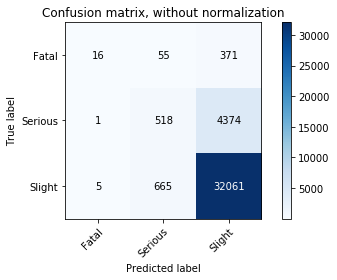

In [168]:
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_classification_test, predictions_task1_model1_rf, classes=['Fatal', 'Serious', 'Slight'],
                      title='Confusion matrix, without normalization')


<span style="color:Blue">

### KNN Classifier

Confusion matrix, without normalization
[[   33    52   357]
 [   95   551  4247]
 [  275  1370 31086]]


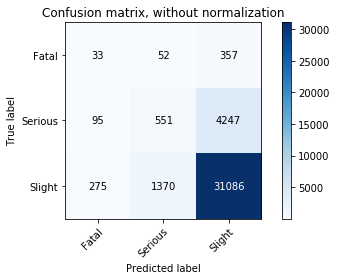

In [169]:
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_classification_test, predictions_task1_model2_knn, classes=['Fatal', 'Serious', 'Slight'],
                      title='Confusion matrix, without normalization')


<span style="color:Blue">

### Gradient Boost Classifier

Confusion matrix, without normalization
[[    6    22   414]
 [    0   102  4791]
 [    0    65 32666]]


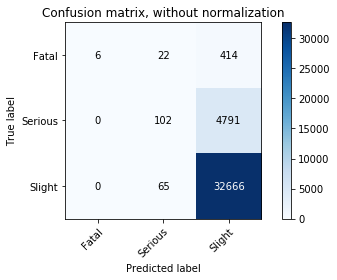

In [170]:
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_classification_test, predictions_task1_model3_gb, classes=['Fatal', 'Serious', 'Slight'],
                      title='Confusion matrix, without normalization')

<span style="color:Blue">

## Accuracy

In [173]:
classes = ['Fatal', 'Serious', 'Slight']

rf_accuracy = per_class_accuracy(y_classification_test, predictions_task1_model1_rf)
knn_accuracy = per_class_accuracy(y_classification_test, predictions_task1_model2_knn)
gb_accuracy = per_class_accuracy(y_classification_test, predictions_task1_model3_gb)

trace1 = go.Bar(
    x=classes,
    y=rf_accuracy,
    name='Random Forest'
)

trace2 = go.Bar(
    x=classes,
    y=knn_accuracy,
    name='KNN'
)

trace3 = go.Bar(
    x=classes,
    y=gb_accuracy,
    name='Gradient Boost'
)

fig = tools.make_subplots(rows=1, cols=3)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)

fig['layout'].update(height=600, width=800, title='Comparison of Accuracy between classification models', 
                     xaxis=dict(title='Models'),
                     yaxis=dict(title='Accuracy'))
py.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



<span style="color:blue">

Comparing the accuracy scores of the models, here are the observations:

* Prediction accuracy for 'Slight' accident severity is very high in all three models
* Prediction accuracy for 'Serious' and 'Fatal' are low in all three models

Among all the models, based on accuracy alone, KNN seems to be better performing model for the provided data.

<span style="color:Blue">

## Precision, Recall and F1 Score

In [185]:
from sklearn.metrics import precision_recall_fscore_support

rf_scores = precision_recall_fscore_support(y_classification_test, predictions_task1_model1_rf, average='weighted')
print(rf_scores)
print(rf_scores[0:3])
print(type(rf_scores))

(0.8112255999015519, 0.8562759417853202, 0.8154114815826498, None)
(0.8112255999015519, 0.8562759417853202, 0.8154114815826498)
<class 'tuple'>


In [187]:
from sklearn.metrics import precision_recall_fscore_support

scores = ['Precision', 'Recall', 'F1 Score']

rf_scores = precision_recall_fscore_support(y_classification_test, predictions_task1_model1_rf, average='weighted')
knn_scores = precision_recall_fscore_support(y_classification_test, predictions_task1_model2_knn, average='weighted')
gb_scores = precision_recall_fscore_support(y_classification_test, predictions_task1_model3_gb, average='weighted')

trace1 = go.Bar(
    x=scores,
    y=rf_scores[0:3],
    name='Random Forest'
)

trace2 = go.Bar(
    x=scores,
    y=knn_scores[0:3],
    name='KNN'
)

trace3 = go.Bar(
    x=scores,
    y=gb_scores[0:3],
    name='Gradient Boost'
)

fig = tools.make_subplots(rows=1, cols=3)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)

fig['layout'].update(height=600, width=800, title='Comparison of Precision, Recall & F1 Score between classification models', 
                     xaxis=dict(title='Models'),
                     yaxis=dict(title='Metrics'))
py.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



<span style="color:blue">

Precision, Recall and F1 Scores of all the classification models are comparable to each other.

<span style="color:Green">

# Modeling and Evaluation 5

**Points: 10**

*Discuss the advantages of each model for each classification task, if any. If there are not advantages, explain why. Is any model better than another? Is the difference significant with 95% confidence? Use proper statistical comparison methods. You must use statistical comparison techniques—be sure they are appropriate for your chosen method of validation as discussed in unit 7 of the course.*


</span>


<span style="color:Blue">

## Regression Models Comparison

### Cross Validation Scores

The goal of the comparison is to make sure all three models are evaluated using a consistent test harness. Since we had enough observations, we used the K-Fold validation with 10 splits to estimate the models performance on new data. Since we are comparing the regression models, we used R-Square metric to compare the models.

In [188]:
# Models array
# Code Reference: https://machinelearningmastery.com/compare-machine-learning-algorithms-python-scikit-learn/
from sklearn import model_selection

models = []
models.append(('Random Forest', task2_model1_rf))
models.append(('Bayesian', task2_model2_br))
models.append(('XGBoost', task2_model3_xgb))

# prepare configuration for cross validation test harness
seed = 7

# evaluate each model in turn
results = []
names = []
scoring = 'r2'

for name, model in models:
    %time kfold = model_selection.KFold(n_splits=10, random_state=seed)
    %time cv_results = model_selection.cross_val_score(model, X_regression_train, y_regression_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

Wall time: 0 ns
Wall time: 12min 14s
Random Forest: 0.645681 (0.015421)
Wall time: 0 ns
Wall time: 22.1 s
Bayesian: 0.611039 (0.012949)
Wall time: 0 ns
Wall time: 7min 1s
XGBoost: 0.654586 (0.016345)


In [190]:
import plotly.offline as py 
import plotly.graph_objs as go

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
py.init_notebook_mode(connected=True)

b1 = go.Box(
    y=results[0],
    name="Random Forest"
)

b2 = go.Box(
    y=results[1],
    name="Bayesian"
)

b3 = go.Box(
    y=results[2],
    name="XGBoost"
)

data = [b1, b2, b3]
py.iplot(data)

<span style="color:Blue">

Based on the cross validation scores, XGBoost regressor performed better than the Random Forest and Bayesian models. The main reason is because of the fact that XGBoost is an ensemble algorithm as it uses multiple decision trees. 

<span style="color:Blue">

### Comparing Other Metrics

<span style="color:Blue">

The following table compares the other metrics including Explained Variance Score, Mean Absolute Error and Mean Squared Error. XGBoost edges the other models in those metrics as well.

In [198]:
metrics = ['Explained Variance Score', 'R-Square', 'Mean Absolute Error', 'Mean Squared Error']
models = [' ', 'Random Forest Regressor', 'Bayesian Ridge Regressor', 'XGBoost Regressor']

rf_metrics = [mt.explained_variance_score(y_regression_test, predictions_task2_model1_rf), 
              mt.r2_score(y_regression_test, predictions_task2_model1_rf),
              mt.mean_absolute_error(y_regression_test, predictions_task2_model1_rf), 
              mt.mean_squared_error(y_regression_test, predictions_task2_model1_rf)]

br_metrics = [mt.explained_variance_score(y_regression_test, predictions_task2_model2_br), 
              mt.r2_score(y_regression_test, predictions_task2_model2_br),
              mt.mean_absolute_error(y_regression_test, predictions_task2_model2_br), 
              mt.mean_squared_error(y_regression_test, predictions_task2_model2_br)]

xgb_metrics = [mt.explained_variance_score(y_regression_test, predictions_task2_model3_xgb), 
               mt.r2_score(y_regression_test, predictions_task2_model3_xgb),
               mt.mean_absolute_error(y_regression_test, predictions_task2_model3_xgb), 
               mt.mean_squared_error(y_regression_test, predictions_task2_model3_xgb)]


trace = go.Table(
    header=dict(values=list(models),
                fill = dict(color='#C2D4FF'),
                align = ['left'] * 5),
    cells=dict(values=[metrics, rf_metrics, br_metrics, xgb_metrics],
               fill = dict(color='#F5F8FF'),
               align = ['left'] * 5))
data = [trace]
py.iplot(data)


<span style="color:Green">

# Modeling and Evaluation 6

**Points: 10**

*Which attributes from your analysis are most important? Use proper methods discussed in class to evaluate the importance of different attributes. Discuss the results and hypothesize about why certain attributes are more important than others for a given classification task.*

</span>


<span style="color:Blue">

### Random Forest Classifier

In [278]:
df3 = pd.DataFrame(task1_model1_rf.feature_importances_, X_classification.columns)
df4 = df3.sort_values([0], ascending=False)
df5 = df4.head(15)
df5

,0
Latitude,0.064805
Longitude,0.062635
Date.day-of-month,0.050978
Date.minute,0.050739
Date.hour,0.047070
Age of Vehicle,0.044970
Date.month,0.040808
Date.day-of-week,0.035154
Number of Vehicles,0.026365
Number of Casualties,0.025349


<span style="color:Blue">

Based on the feature importances, the Random Forest Classifier uses Latitude, Longitude, Date of the month and the age of the vehicles as some of the top features. Some of the highlights:

* Location plays an important role in the accidents
* Certain days of the month and certain times in the day also play some role in the accidents
* Age of the vehicle also contributes to the accidents

<span style="color:Blue">

### XGBoost Regressor

In [279]:
df3 = pd.DataFrame(task2_model3_xgb.feature_importances_, X_regression.columns)
df4 = df3.sort_values([0], ascending=False)
df5 = df4.head(15)
df5

,0
Latitude,0.189383
Longitude,0.116212
Vehicle Type_Goods 7.5 tonnes mgw and over,0.086083
Vehicle Type_Bus or coach (17 or more pass seats),0.076040
Age of Vehicle,0.048780
Vehicle Type_Goods over 3.5t. and under 7.5t,0.043042
Vehicle Type_Agricultural vehicle,0.035868
Age Band of Driver_16 - 20,0.030129
Vehicle Type_Car,0.025825
Sex of Driver_Female,0.024390


<span style="color:Blue">

Based on the feature importances, the XGBoost Regressor uses Latitude, Longitude, Vehicle Type as some of the top features. Some of the highlights:

* We do not have a good idea why latitude and longitude plays a role in determining the engine capacity
* Different Vehicle Types play a key role in the engine capacity prediction which is very relevant to the model
* Age of the vehicle also contributes to the engine capacity which is unexplainable

<span style="color:Green">

# Deployment

**Points: 5**

*How useful is your model for interested parties (i.e., the companies or organizations that might want to use it for prediction)? How would you measure the model's value if it was used by these parties? How would your deploy your model for interested parties? What other data should be collected? How often would the model need to be updated, etc.?*

</span>


<span style="color:Blue">

### Classification Model

The classfication models that predict the severity of the accident perform very well with good accuracy. The models can be used in couple of scenarios:

* The accident response team can use the models to predict the severity of the accidents based on the accident data recorded by the IoT devices, witnesses and the first responders. This can provide valuable notice to the hospitals and other services like the fire departments to be ready to deal with casualities.

* Modified models can provide valuable analysis of the past accidents and can help the city planning teams to take accident prevention steps including installing new traffic signals in accident prone areas and provide warning signs to drivers.


### Regression Model

The regression models predict the engine capacity of the vehicles involved in the accidents. Even though the practical use of the predictive capabilities are limited, the exercise provided us a good opportunity to prepare the data for regression, develop predictive regression models and also evaluate the performance of the regression models. 

To measure the value of the models the user needs to consider the criteria detailed above as well as the cost implications involved in implementing changes based on the outcomes. Specifically, regarding the classification models, these scenarios involve a great deal of resources beyond financial, and these resource implications also need to be evaluated.

To further improve the models, more data on traffic accidents in these areas can be collected over several years. The more data that is gathered, the greater the effectiveness of the models, and the better outcomes/decisions can be made as to the best path of accident mitigation.


<span style="color:Green">

# Exceptional Work

**Points: 10**

*You have free reign to provide additional analyses. One idea: grid search parameters in a parallelized fashion and visualize the performances across attributes. Which parameters are most significant for making a good model for each classification algorithm.*


</span>


In [200]:
#
# Code Reference: https://plot.ly/scikit-learn/plot-bayesian-ridge/
#
import plotly.offline as py 
import plotly.graph_objs as go

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
py.init_notebook_mode(connected=True)

lw = 2

w = np.zeros(X_regression_train.shape[1])

p1 = go.Scatter(y=[float(i)/sum(task2_model2_br.coef_) for i in task2_model2_br.coef_],
                mode='lines', 
                line=dict(color='lightgreen', width=lw),
                name="Bayesian Ridge")

p2 = go.Scatter(y=w, 
                mode='lines', 
                line=dict(color='gold', width=lw), 
                name="Ground truth")

p3 = go.Scatter(y=[float(i)/sum(task2_model1_rf.feature_importances_) for i in task2_model1_rf.feature_importances_], 
                mode='lines', 
                line=dict(color='navy'),
                name="Random Forest")

p4 = go.Scatter(y=[float(i)/sum(task2_model3_xgb.feature_importances_) for i in task2_model3_xgb.feature_importances_], 
                mode='lines', 
                line=dict(color='red'),
                name="XGBoost")

layout = go.Layout(title="Weights of the model",
                   xaxis=dict(title="Features"),
                   yaxis=dict(title="Values of the weights")
                  )
fig = go.Figure(data=[p1, p2, p3, p4], layout=layout)
py.iplot(fig)

In [297]:
print(X_regression.columns[170], ', ', X_regression.columns[55], ', ', X_regression.columns[56], ', ', X_regression.columns[57], ', ', X_regression.columns[61])

Propulsion Code_Heavy oil ,  Vehicle Type_Bus or coach (17 or more pass seats) ,  Vehicle Type_Car ,  Vehicle Type_Goods 7.5 tonnes mgw and over ,  Vehicle Type_Motorcycle 125cc and under


<span style="color:Blue">

### Significant Attributes for Regression based on weights

Based on the weights, the following are the attributes that play a significant role in all the regression models:

* Propulsion Code_Heavy oil 
* Vehicle Type_Bus or coach (17 or more pass seats) 
* Vehicle Type_Car 
* Vehicle Type_Goods 7.5 tonnes mgw and over 
* Vehicle Type_Motorcycle 125cc and under

These attributes are the key characteristics of the vehicle and the models identified them as key attributes in predicting the engine capacity.

<span style="color:Green">

## References
